In [16]:
# clone YOLOv5 repository
%cd yolov5

[WinError 2] The system cannot find the file specified: 'yolov5'
C:\Users\uabhi\MY JUPYTER\Football_detaction\yolov5


In [18]:
!pip install -qr requirements.txt  
import torch

from IPython.display import Image, clear_output

print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.9.0+cpu CPU


ERROR: Invalid requirement: '#'


In [19]:
!pip install -q roboflow
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="roboflow-yolov5")

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
aiohttp 3.7.4 requires chardet<4.0,>=2.0, but you have chardet 4.0.0 which is incompatible.


upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=roboflow-yolov5


In [20]:
%cd yolov5

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="HrCmuporG3VXAaNzp3WN")
project = rf.workspace().project("football_detaction")
dataset = project.version(1).download("yolov5")

[WinError 2] The system cannot find the file specified: 'yolov5'
C:\Users\uabhi\MY JUPYTER\Football_detaction\yolov5
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to football_detaction-1 in yolov5pytorch:: 100%|████| 414/414 [00:00<00:00, 1105.23it/s]


In [21]:

%cat {dataset.location}/data.yaml

UsageError: Line magic function `%cat` not found.


# Define Model Configuration and Architecture

We will write a yaml script that defines the parameters for our model like the number of classes, anchors, and each layer.

You do not need to edit these cells, but you may.

In [22]:
# define number of classes based on YAML
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [26]:
%cat yolov5/models/yolov5s.yaml

UsageError: Line magic function `%cat` not found.


In [27]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [30]:
%%writetemplate yolov5/models/yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

FileNotFoundError: [Errno 2] No such file or directory: 'yolov5/models/yolov5s.yaml'

# Train Custom YOLOv5 Detector

### Next, we'll fire off training!


Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive [folder](https://drive.google.com/open?id=1Drs_Aiu7xx6S-ix95f9kNsA6ueKRpN2J))
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [34]:
# train yolov5s on custom data for 40 epochs
# time its performance

%cd C:\Users\uabhi\MY JUPYTER\Football_detaction\yolov5
!python train.py --img 416 --batch 10 --epochs 100 --data {dataset.location}/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

C:\Users\uabhi\MY JUPYTER\Football_detaction\yolov5


Traceback (most recent call last):
  File "train.py", line 24, in <module>
    import test  # import test.py to get mAP after each epoch
  File "C:\Users\uabhi\MY JUPYTER\Football_detaction\yolov5\test.py", line 12, in <module>
    from models.experimental import attempt_load
  File "C:\Users\uabhi\MY JUPYTER\Football_detaction\yolov5\models\experimental.py", line 7, in <module>
    from models.common import Conv, DWConv
  File "C:\Users\uabhi\MY JUPYTER\Football_detaction\yolov5\models\common.py", line 14, in <module>
    from utils.plots import color_list, plot_one_box
  File "C:\Users\uabhi\MY JUPYTER\Football_detaction\yolov5\utils\plots.py", line 15, in <module>
    import seaborn as sns
ModuleNotFoundError: No module named 'seaborn'


# Evaluateing YOLOv5 Detector Performance

In [11]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

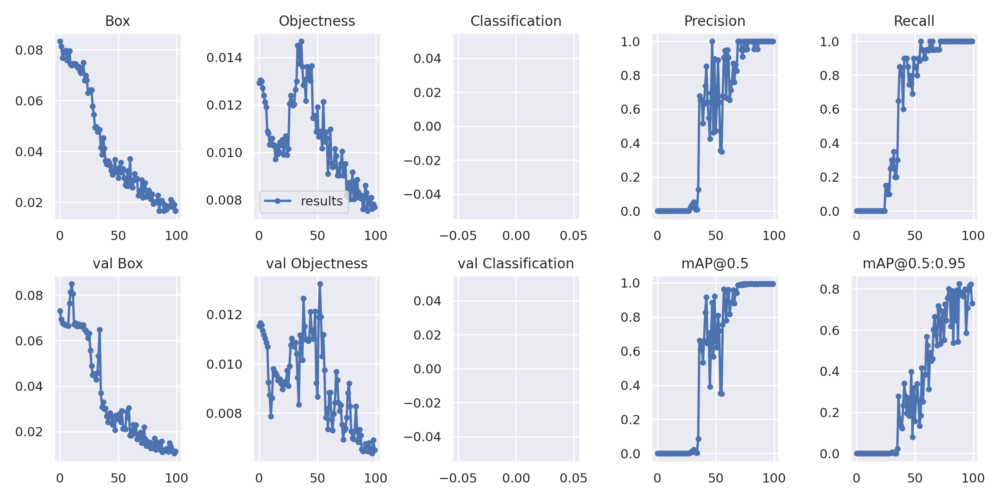

In [12]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason... 
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)  # view results.png

### Visualizeing Training Data with Labels

GROUND TRUTH TRAINING DATA:


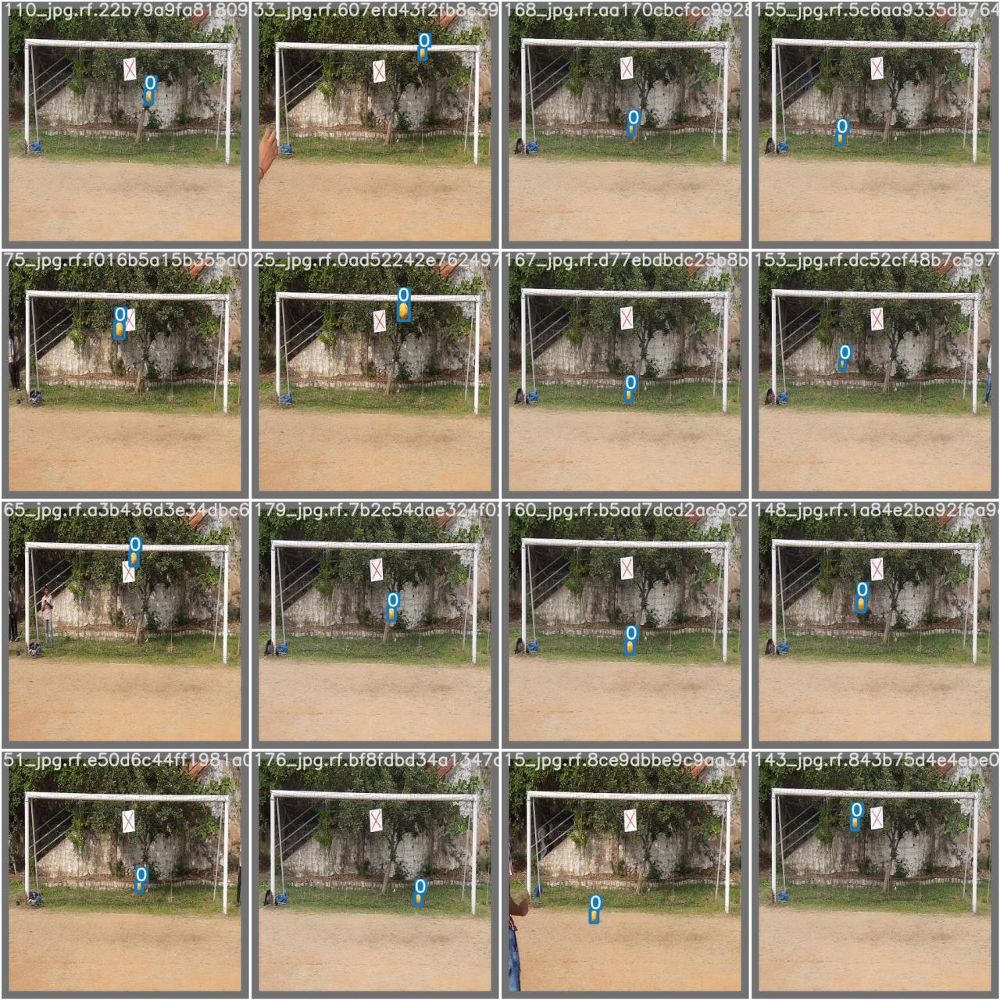

In [13]:
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/test_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


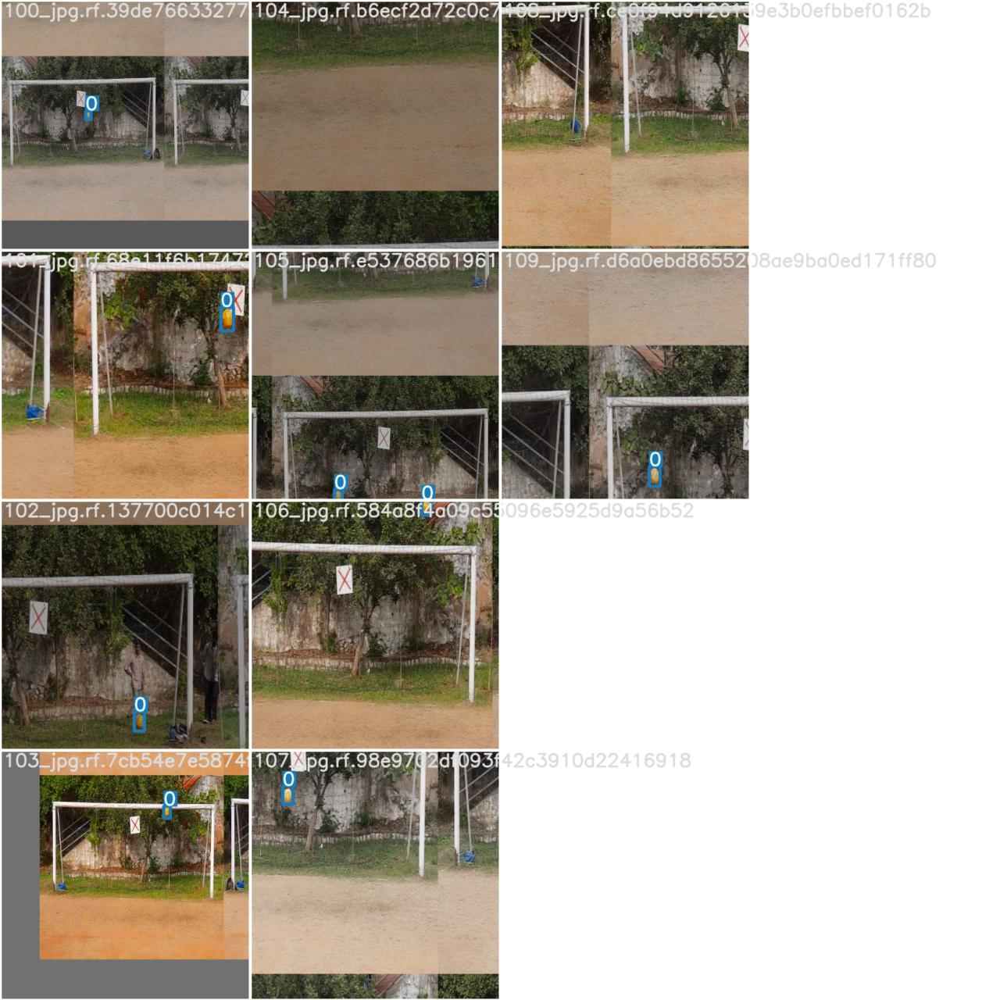

In [14]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch0.jpg', width=900)

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [41]:
# trained weights are saved by default in our weights folder
%ls runs/

detect/  train/


In [42]:
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [38]:
# when I ran this, I saw .007 second inference time.
%cd C:\Users\uabhi\MY JUPYTER\Football_detaction\yolov5
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.3 --source /content/yolov5/football_detaction-1/test/images

C:\Users\uabhi\MY JUPYTER\Football_detaction\yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.3, device='', exist_ok=False, img_size=416, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='/content/yolov5/football_detaction-1/test/images', update=False, view_img=False, weights=['runs/train/yolov5s_results/weights/best.pt'])


Traceback (most recent call last):
  File "detect.py", line 167, in <module>
    check_requirements()
  File "C:\Users\uabhi\MY JUPYTER\Football_detaction\yolov5\utils\general.py", line 92, in check_requirements
    pkg_resources.require(requirements)  # DistributionNotFound or VersionConflict exception if requirements not met
  File "C:\Users\uabhi\anaconda3\envs\tf\lib\site-packages\pkg_resources\__init__.py", line 886, in require
    needed = self.resolve(parse_requirements(requirements))
  File "C:\Users\uabhi\anaconda3\envs\tf\lib\site-packages\pkg_resources\__init__.py", line 772, in resolve
    raise DistributionNotFound(req, requirers)
pkg_resources.DistributionNotFound: The 'pycocotools>=2.0' distribution was not found and is required by the application


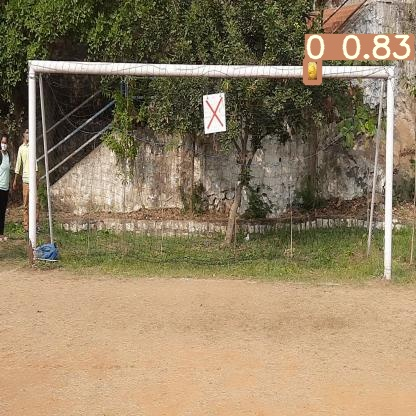

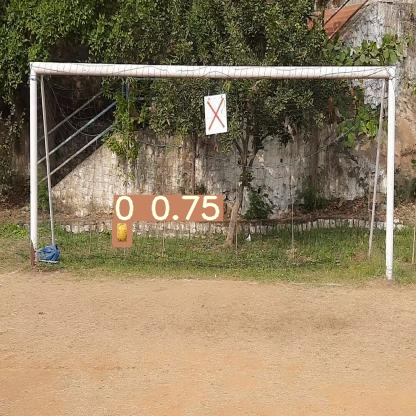

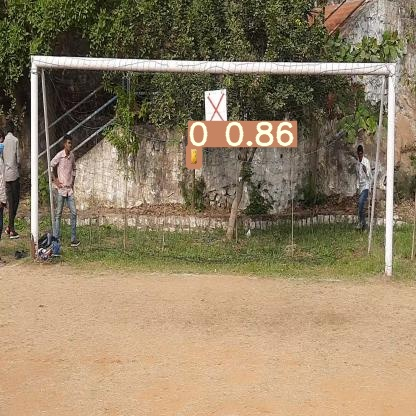

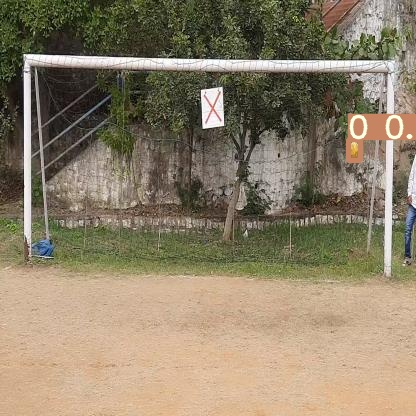

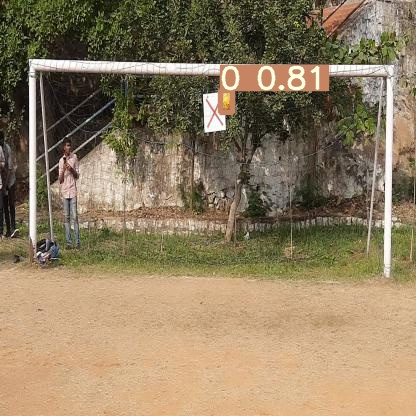

...

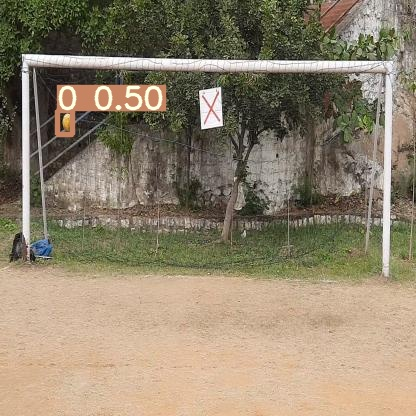

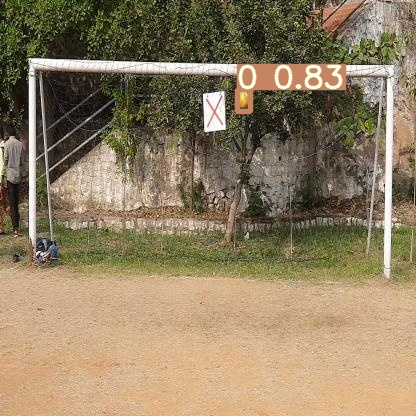

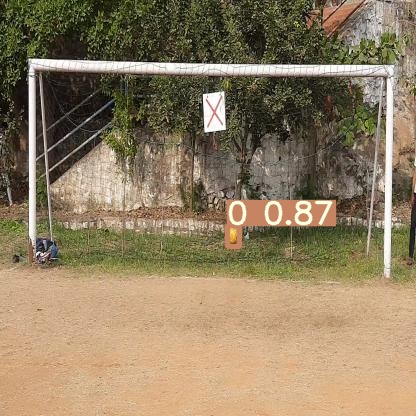

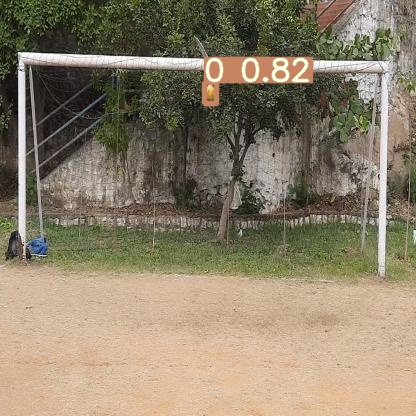

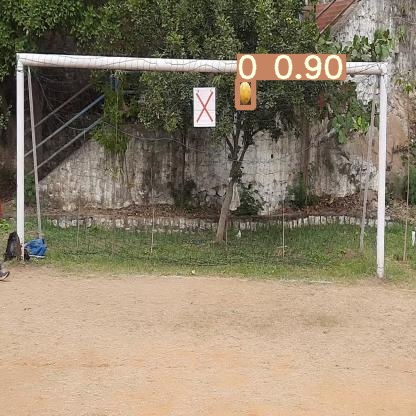

In [44]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp2/*.jpg'):
    display(Image(filename=imageName))
    print("\n")

# Export Trained Weights for Future Inference

Now that you have trained your custom detector, you can export the trained weights you have made here for inference on your device elsewhere

In [20]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [26]:
%cp /content/yolov5/runs/train/yolov5s_results/weights/best.pt /content/gdrive/My\ Drive

cp: -r not specified; omitting directory '/content/yolov5/runs'


In [37]:
!zip -r /content/yolov5/runs/train /content/Folder_To_Zip

	zip warning: name not matched: /content/Folder_To_Zip

zip error: Nothing to do! (try: zip -r /content/yolov5/runs/train . -i /content/Folder_To_Zip)
